In [1]:
import os
import random

import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim

import matplotlib.pyplot as plt

# Filter duplicates

In [2]:
import cv2
import os
import numpy as np

def average_hash(image, hash_size=8):
    resized = cv2.resize(image, (hash_size, hash_size))
    gray = cv2.cvtColor(resized, cv2.COLOR_BGR2GRAY)
    avg = gray.mean()
    return np.array(gray > avg, dtype=int).flatten()

def hamming_distance(hash1, hash2):
    return np.count_nonzero(hash1 != hash2)

def keep_only_unique_images(folder_path, threshold=10):
    image_hashes = {}
    duplicates = []

    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
            image_path = os.path.join(folder_path, filename)
            image = cv2.imread(image_path)
            image_hash = average_hash(image)

            is_duplicate = False
            for stored_filename, stored_hash in image_hashes.items():
                distance = hamming_distance(image_hash, stored_hash)
                if distance < threshold:
                    duplicates.append(image_path)
                    is_duplicate = True
                    break

            if not is_duplicate:
                image_hashes[filename] = image_hash

    return duplicates

# Run the function on your folder
folder_path = '/kaggle/input/puzzle-captcha-dataset/images/images'
duplicates = keep_only_unique_images(folder_path)


In [3]:
len(duplicates)

12083

In [4]:
all_files = os.listdir("/kaggle/input/puzzle-captcha-dataset/images/images")
len(all_files)

12364

In [5]:
unique_images = [f'/kaggle/input/puzzle-captcha-dataset/images/images/{el}' for el in all_files if f'/kaggle/input/puzzle-captcha-dataset/images/images/{el}' not in duplicates]
len(unique_images)

281

We have 281 unique images let's see what there

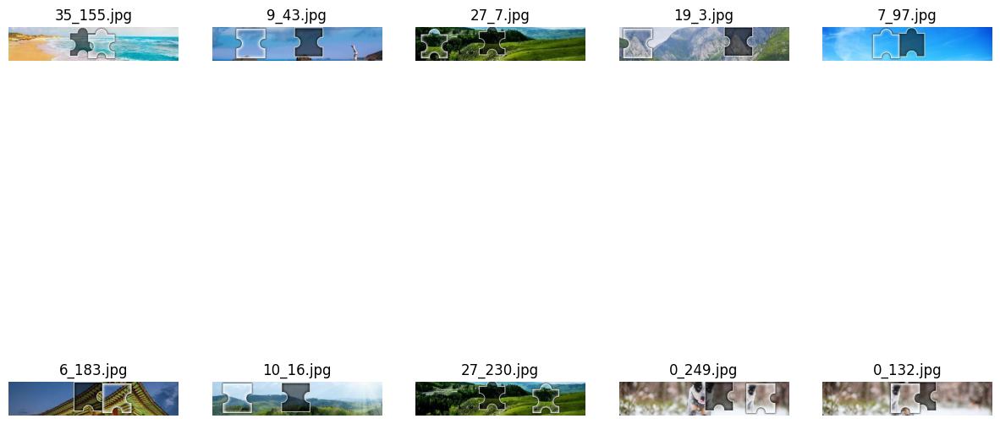

In [6]:
def plot_random_images(image_paths, num_images=10):
    random_images = random.sample(image_paths, min(num_images, len(image_paths)))
    plt.figure(figsize=(15, 10))
    for i, img_path in enumerate(random_images):
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        plt.subplot(2, 5, i + 1)
        plt.imshow(image)
        plt.title(os.path.basename(img_path))
        plt.axis('off')
    plt.show()

plot_random_images(unique_images)

# Check YOLO model

In [7]:
!pip install ultralytics
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.6/877.6 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 73.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 4.9 MB/s eta 0:00:00


In [8]:
from PIL import Image
from io import BytesIO


from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


model was taken from https://github.com/chenwei-zhao/captcha-recognizer/tree/main

In [9]:
model = YOLO("/kaggle/input/slice-model-yolo/pytorch/default/1/slider.onnx", task="detect")

In [10]:
def get_captcha_position(image, show_result=False):
    box = []
    conf = 0
    results = model.predict(
            source=image,
            device='cpu',
            conf=0.8,
            imgsz=[416, 416], 
        )
    if not len(results):
        return 

    box_with_max_conf = max(results, key=lambda x: x.boxes.conf.max())
    if show_result:
        box_with_max_conf.show()

    box_with_conf = box_with_max_conf.boxes.data.tolist()
    return box_with_conf[0], box_with_conf[1]

In [11]:
def plot_image(img_path):
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.title(os.path.basename(img_path))
    plt.axis('off')
    plt.show()

Loading /kaggle/input/slice-model-yolo/pytorch/default/1/slider.onnx for ONNX Runtime inference...

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_4.jpg: 416x416 1 t, 1 s, 136.0ms
Speed: 33.6ms preprocess, 136.0ms inference, 59.4ms postprocess per image at shape (1, 3, 416, 416)


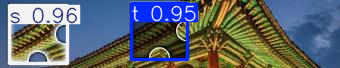

[[9.898750305175781,
  5.25974702835083,
  67.54338836669922,
  63.8094367980957,
  0.9584978818893433,
  2.0],
 [131.6539306640625,
  3.3856112957000732,
  187.710693359375,
  59.32229995727539,
  0.9479845762252808,
  0.0]]

In [12]:
image_path_test = "/kaggle/input/puzzle-captcha-dataset/images/images/6_4.jpg"
results = model.predict(
            source=image_path_test,
            device='cpu',
            conf=0.8,
            imgsz=[416, 416], 
        )
box_with_max_conf = max(results, key=lambda x: x.boxes.conf.max())
box_with_max_conf.show()
box_with_max_conf.boxes.data.tolist()


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/42_52.jpg: 416x416 1 t, 1 s, 128.0ms
Speed: 1.5ms preprocess, 128.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)


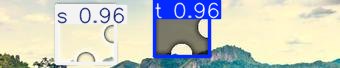


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/12_12.jpg: 416x416 1 t, 1 s, 203.1ms
Speed: 1.2ms preprocess, 203.1ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 416)


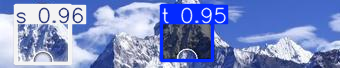


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_9.jpg: 416x416 1 t, 1 s, 116.4ms
Speed: 1.2ms preprocess, 116.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


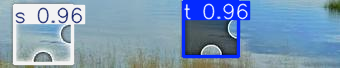


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_265.jpg: 416x416 1 t, 1 s, 112.9ms
Speed: 1.0ms preprocess, 112.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


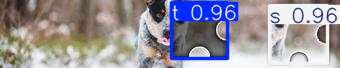


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/29_207.jpg: 416x416 1 t, 1 s, 115.5ms
Speed: 2.7ms preprocess, 115.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


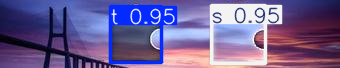


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/27_92.jpg: 416x416 1 t, 115.5ms
Speed: 1.2ms preprocess, 115.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


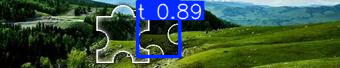

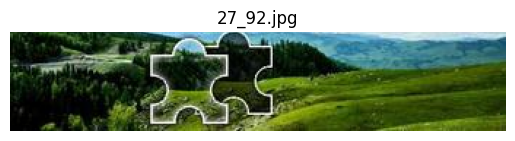

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/27_92.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_200.jpg: 416x416 1 t, 1 s, 207.8ms
Speed: 1.1ms preprocess, 207.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


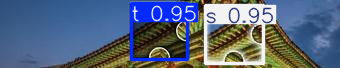


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/8_248.jpg: 416x416 1 t, 1 s, 204.0ms
Speed: 1.2ms preprocess, 204.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


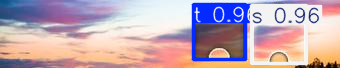


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_223.jpg: 416x416 1 t, 1 s, 204.6ms
Speed: 3.5ms preprocess, 204.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


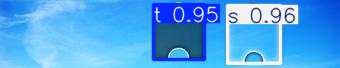


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_18.jpg: 416x416 1 t, 1 s, 115.8ms
Speed: 1.2ms preprocess, 115.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


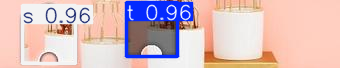

In [13]:
for _ in range(10):
    image_path = random.choice(unique_images)
    try:
        get_captcha_position(image_path, show_result=True)
    except:
        plot_image(image_path)
        print(f"ERROR: for {image_path} captcha was not found!")
    print("=======================================")


image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/8_248.jpg: 416x416 1 t, 1 s, 121.9ms
Speed: 1.1ms preprocess, 121.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/20_211.jpg: 416x416 (no detections), 115.6ms
Speed: 1.2ms preprocess, 115.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


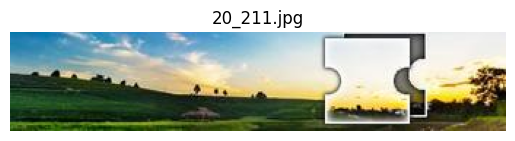

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/20_211.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/17_21.jpg: 416x416 1 t, 1 s, 116.7ms
Speed: 1.4ms preprocess, 116.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/8_210.jpg: 416x416 1 s, 116.8ms
Speed: 1.2ms preprocess, 116.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


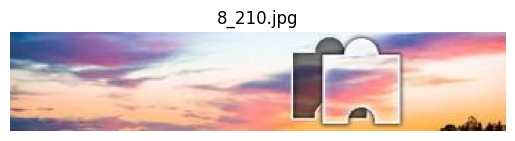

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/8_210.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/36_257.jpg: 416x416 1 t, 1 s, 148.0ms
Speed: 1.3ms preprocess, 148.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/22_56.jpg: 416x416 1 t, 118.1ms
Speed: 1.1ms preprocess, 118.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


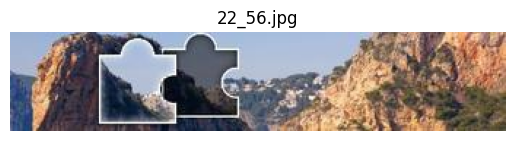

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/22_56.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/37_181.jpg: 416x416 1 t, 2 ss, 208.0ms
Speed: 1.4ms preprocess, 208.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/18_167.jpg: 416x416 1 t, 116.6ms
Speed: 1.3ms preprocess, 116.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


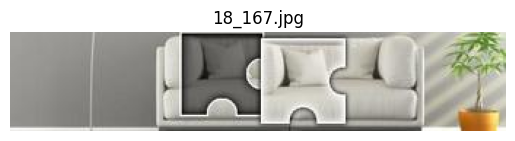

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/18_167.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_258.jpg: 416x416 1 t, 121.9ms
Speed: 1.0ms preprocess, 121.9ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)


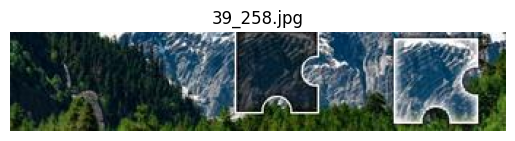

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_258.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/14_279.jpg: 416x416 1 t, 1 s, 206.7ms
Speed: 1.1ms preprocess, 206.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_141.jpg: 416x416 1 s, 117.5ms
Speed: 1.2ms preprocess, 117.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


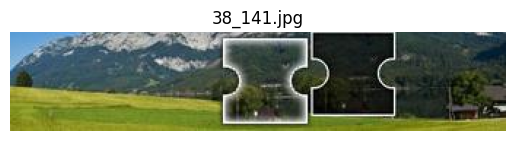

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/38_141.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/24_27.jpg: 416x416 1 t, 1 s, 207.3ms
Speed: 1.4ms preprocess, 207.3ms inference, 4.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/43_11.jpg: 416x416 1 t, 1 s, 133.0ms
Speed: 1.1ms preprocess, 133.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/5_0.jpg: 416x416 1 t, 1 s, 155.5ms
Speed: 1.1ms preprocess, 155.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/16_231.jpg: 416x416 1 t, 1 s, 117.0ms
Speed: 1.1ms preprocess, 117.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_75.jpg: 416x416 1 t, 1 s, 118.6ms
Speed: 1.2ms prepr

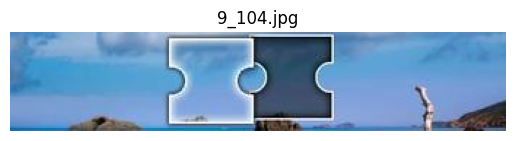

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/9_104.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/29_115.jpg: 416x416 (no detections), 122.1ms
Speed: 1.5ms preprocess, 122.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


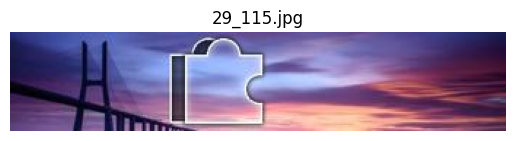

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/29_115.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/35_119.jpg: 416x416 1 s, 117.4ms
Speed: 1.0ms preprocess, 117.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


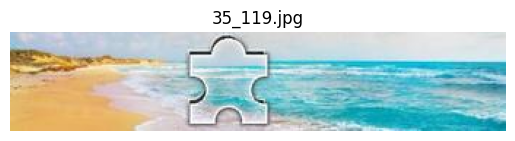

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/35_119.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_200.jpg: 416x416 1 t, 1 s, 153.0ms
Speed: 1.4ms preprocess, 153.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/2_245.jpg: 416x416 1 t, 1 s, 115.3ms
Speed: 1.5ms preprocess, 115.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/11_122.jpg: 416x416 1 t, 1 s, 207.4ms
Speed: 1.2ms preprocess, 207.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_86.jpg: 416x416 1 t, 1 s, 202.5ms
Speed: 1.2ms preprocess, 202.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_196.jpg: 416x416 1 t, 1 s, 114.9ms
Speed: 1.1ms pr

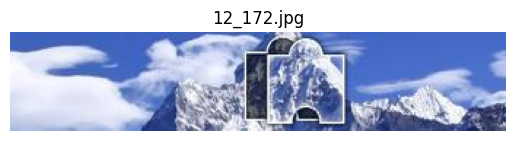

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/12_172.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_223.jpg: 416x416 1 t, 1 s, 120.5ms
Speed: 1.4ms preprocess, 120.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/34_24.jpg: 416x416 1 t, 1 s, 116.1ms
Speed: 1.2ms preprocess, 116.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_161.jpg: 416x416 1 s, 117.8ms
Speed: 1.2ms preprocess, 117.8ms inference, 2.4ms postprocess per image at shape (1, 3, 416, 416)


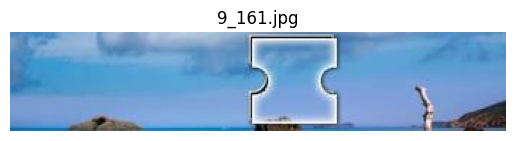

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/9_161.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_124.jpg: 416x416 (no detections), 118.3ms
Speed: 1.0ms preprocess, 118.3ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


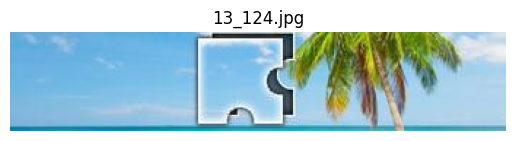

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/13_124.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_229.jpg: 416x416 1 t, 1 s, 122.6ms
Speed: 1.1ms preprocess, 122.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/34_126.jpg: 416x416 1 t, 117.7ms
Speed: 1.2ms preprocess, 117.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


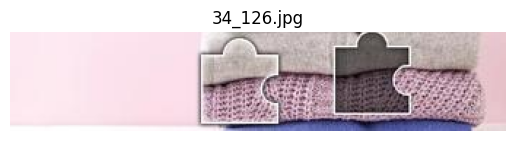

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/34_126.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/26_179.jpg: 416x416 1 s, 211.3ms
Speed: 1.7ms preprocess, 211.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


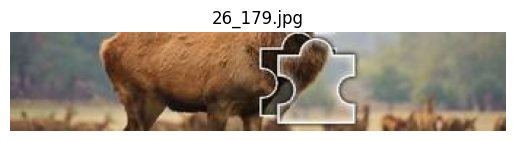

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/26_179.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/26_255.jpg: 416x416 1 t, 1 s, 204.2ms
Speed: 1.0ms preprocess, 204.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_249.jpg: 416x416 1 t, 1 s, 204.7ms
Speed: 1.3ms preprocess, 204.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/4_122.jpg: 416x416 1 s, 206.5ms
Speed: 2.4ms preprocess, 206.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


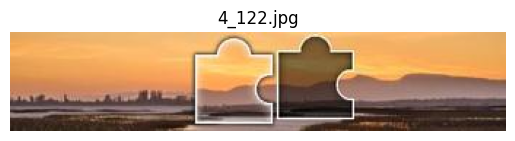

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/4_122.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/43_241.jpg: 416x416 1 t, 1 s, 213.4ms
Speed: 1.8ms preprocess, 213.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/21_18.jpg: 416x416 1 t, 1 s, 205.5ms
Speed: 1.3ms preprocess, 205.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_217.jpg: 416x416 1 t, 1 s, 205.2ms
Speed: 2.3ms preprocess, 205.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/42_265.jpg: 416x416 1 t, 1 s, 206.6ms
Speed: 1.2ms preprocess, 206.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/10_150.jpg: 416x416 (no detections), 204.4ms
Speed: 1

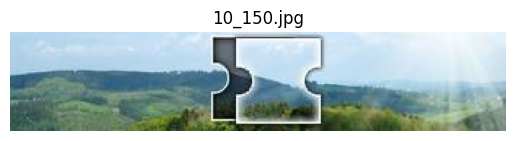

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/10_150.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_198.jpg: 416x416 1 s, 119.4ms
Speed: 1.5ms preprocess, 119.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


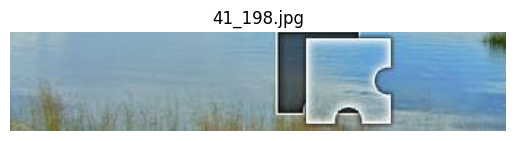

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/41_198.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/33_127.jpg: 416x416 1 t, 1 s, 128.1ms
Speed: 1.4ms preprocess, 128.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/40_41.jpg: 416x416 1 t, 1 s, 116.1ms
Speed: 1.2ms preprocess, 116.1ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/35_155.jpg: 416x416 1 t, 1 s, 115.7ms
Speed: 1.2ms preprocess, 115.7ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/40_170.jpg: 416x416 1 t, 117.7ms
Speed: 1.2ms preprocess, 117.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


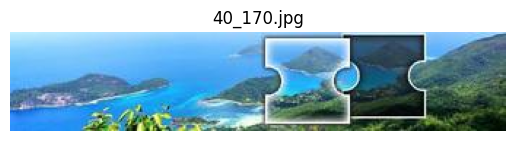

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/40_170.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_97.jpg: 416x416 1 t, 1 s, 204.1ms
Speed: 1.4ms preprocess, 204.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/36_184.jpg: 416x416 1 t, 1 s, 115.3ms
Speed: 1.1ms preprocess, 115.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/1_163.jpg: 416x416 1 s, 114.8ms
Speed: 1.4ms preprocess, 114.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


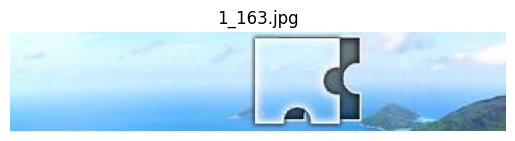

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/1_163.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_45.jpg: 416x416 1 t, 1 s, 206.0ms
Speed: 2.1ms preprocess, 206.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_16.jpg: 416x416 1 t, 1 s, 114.8ms
Speed: 1.5ms preprocess, 114.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/40_216.jpg: 416x416 (no detections), 204.0ms
Speed: 1.2ms preprocess, 204.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)


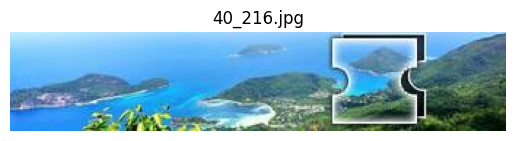

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/40_216.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_95.jpg: 416x416 1 t, 1 s, 208.2ms
Speed: 1.8ms preprocess, 208.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/33_84.jpg: 416x416 1 t, 1 s, 115.9ms
Speed: 1.2ms preprocess, 115.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/12_12.jpg: 416x416 1 t, 1 s, 203.0ms
Speed: 1.1ms preprocess, 203.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/19_3.jpg: 416x416 1 t, 1 s, 202.6ms
Speed: 1.2ms preprocess, 202.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/23_26.jpg: 416x416 1 t, 1 s, 201.0ms
Speed: 1.1ms prepro

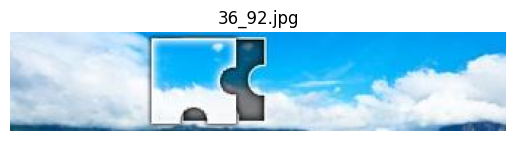

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/36_92.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/17_101.jpg: 416x416 1 t, 130.3ms
Speed: 1.1ms preprocess, 130.3ms inference, 4.8ms postprocess per image at shape (1, 3, 416, 416)


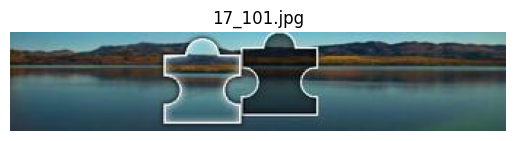

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/17_101.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_225.jpg: 416x416 1 t, 1 s, 129.3ms
Speed: 1.4ms preprocess, 129.3ms inference, 4.5ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/34_251.jpg: 416x416 (no detections), 127.0ms
Speed: 3.8ms preprocess, 127.0ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


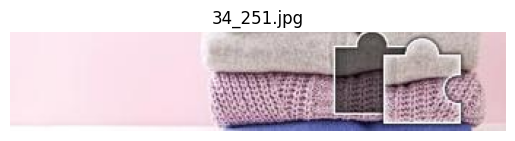

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/34_251.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/19_275.jpg: 416x416 1 t, 1 s, 116.0ms
Speed: 1.1ms preprocess, 116.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/1_246.jpg: 416x416 1 t, 1 s, 128.5ms
Speed: 1.2ms preprocess, 128.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/21_102.jpg: 416x416 1 t, 1 s, 115.0ms
Speed: 1.2ms preprocess, 115.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/31_183.jpg: 416x416 1 t, 1 s, 123.4ms
Speed: 1.2ms preprocess, 123.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_200.jpg: 416x416 1 t, 1 s, 115.1ms
Speed: 1.4ms p

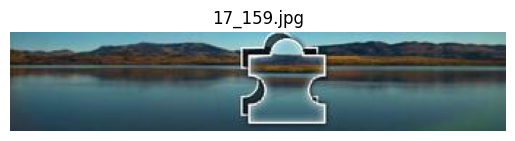

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/17_159.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/36_6.jpg: 416x416 1 t, 1 s, 117.9ms
Speed: 1.1ms preprocess, 117.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/19_136.jpg: 416x416 1 t, 1 s, 116.8ms
Speed: 1.2ms preprocess, 116.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_24.jpg: 416x416 1 t, 1 s, 115.0ms
Speed: 1.1ms preprocess, 115.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/25_12.jpg: 416x416 1 t, 1 s, 115.2ms
Speed: 1.2ms preprocess, 115.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/32_176.jpg: 416x416 (no detections), 116.7ms
Speed: 1.2

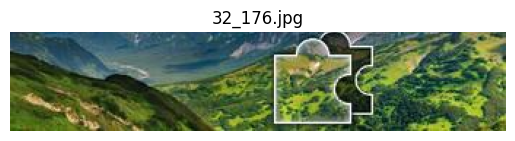

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/32_176.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/40_274.jpg: 416x416 1 t, 208.1ms
Speed: 1.4ms preprocess, 208.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


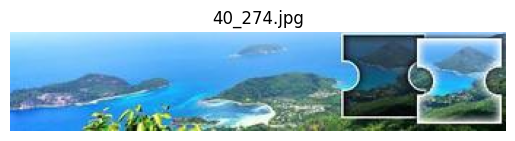

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/40_274.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_7.jpg: 416x416 1 t, 198.8ms
Speed: 24.6ms preprocess, 198.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


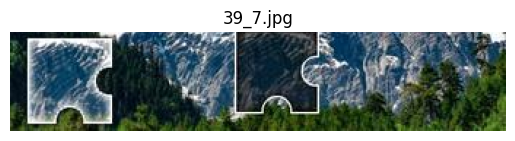

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_7.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/14_12.jpg: 416x416 1 t, 1 s, 205.0ms
Speed: 1.4ms preprocess, 205.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/35_144.jpg: 416x416 1 t, 1 s, 116.4ms
Speed: 1.2ms preprocess, 116.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_177.jpg: 416x416 1 s, 115.2ms
Speed: 1.2ms preprocess, 115.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


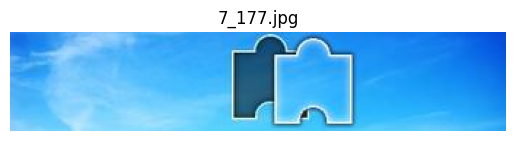

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/7_177.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_98.jpg: 416x416 1 t, 206.9ms
Speed: 1.1ms preprocess, 206.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


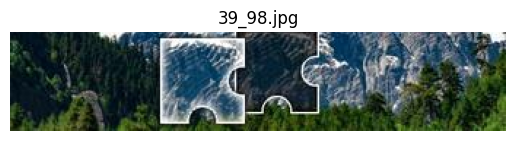

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_98.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/21_180.jpg: 416x416 1 s, 118.5ms
Speed: 1.4ms preprocess, 118.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


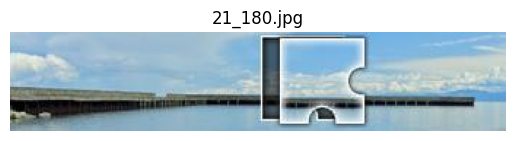

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/21_180.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_108.jpg: 416x416 1 t, 1 s, 116.5ms
Speed: 1.1ms preprocess, 116.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/23_237.jpg: 416x416 1 t, 117.4ms
Speed: 1.3ms preprocess, 117.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


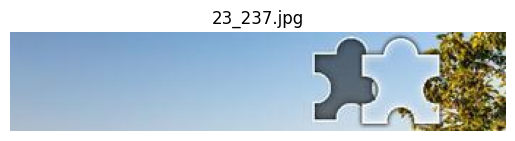

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/23_237.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_167.jpg: 416x416 1 s, 140.9ms
Speed: 4.8ms preprocess, 140.9ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


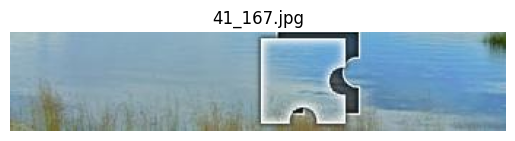

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/41_167.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/43_170.jpg: 416x416 (no detections), 201.0ms
Speed: 1.1ms preprocess, 201.0ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 416)


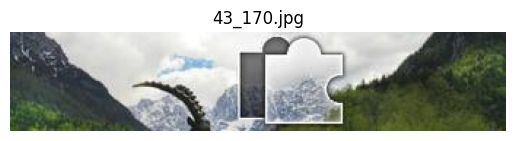

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/43_170.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_244.jpg: 416x416 1 t, 211.7ms
Speed: 4.3ms preprocess, 211.7ms inference, 11.0ms postprocess per image at shape (1, 3, 416, 416)


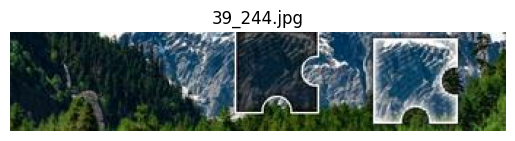

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_244.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/33_15.jpg: 416x416 1 t, 1 s, 190.5ms
Speed: 2.5ms preprocess, 190.5ms inference, 11.0ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_139.jpg: 416x416 1 s, 177.5ms
Speed: 35.8ms preprocess, 177.5ms inference, 11.2ms postprocess per image at shape (1, 3, 416, 416)


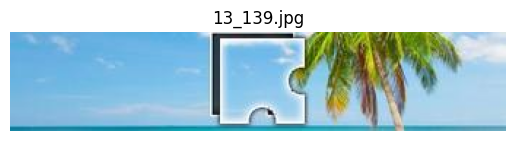

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/13_139.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/37_18.jpg: 416x416 1 t, 1 s, 215.6ms
Speed: 8.7ms preprocess, 215.6ms inference, 10.8ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_179.jpg: 416x416 1 s, 165.0ms
Speed: 29.3ms preprocess, 165.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


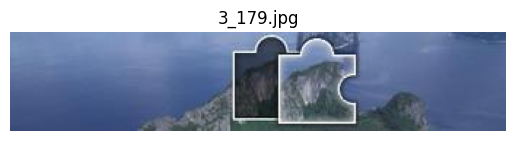

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/3_179.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/29_52.jpg: 416x416 1 t, 120.2ms
Speed: 1.5ms preprocess, 120.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


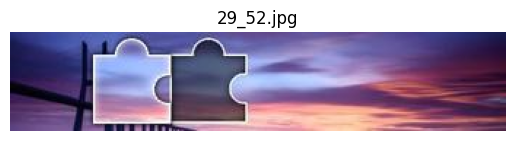

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/29_52.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/21_227.jpg: 416x416 1 t, 1 s, 206.0ms
Speed: 1.4ms preprocess, 206.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/22_218.jpg: 416x416 1 t, 1 s, 116.8ms
Speed: 1.2ms preprocess, 116.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_269.jpg: 416x416 1 t, 1 s, 117.1ms
Speed: 1.2ms preprocess, 117.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/29_207.jpg: 416x416 1 t, 1 s, 115.3ms
Speed: 1.2ms preprocess, 115.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/14_139.jpg: 416x416 1 t, 1 s, 206.0ms
Speed: 1.2ms p

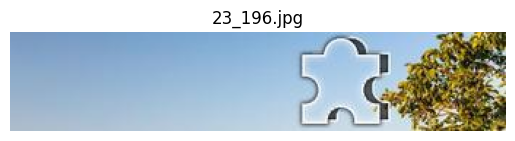

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/23_196.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_47.jpg: 416x416 1 t, 1 s, 203.3ms
Speed: 1.1ms preprocess, 203.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/26_207.jpg: 416x416 1 s, 115.0ms
Speed: 1.6ms preprocess, 115.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


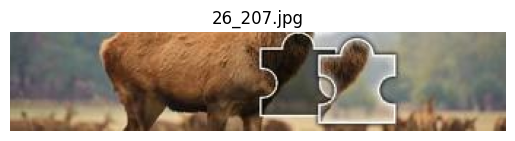

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/26_207.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/28_235.jpg: 416x416 (no detections), 129.5ms
Speed: 1.4ms preprocess, 129.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


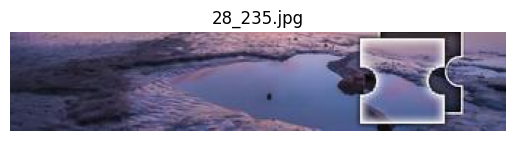

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/28_235.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/28_47.jpg: 416x416 1 t, 1 s, 133.4ms
Speed: 1.5ms preprocess, 133.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/28_211.jpg: 416x416 1 t, 114.5ms
Speed: 1.2ms preprocess, 114.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


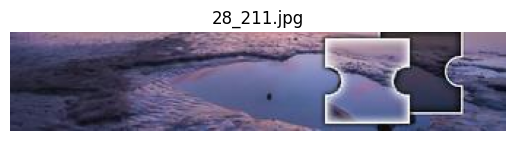

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/28_211.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/19_70.jpg: 416x416 1 t, 1 s, 119.0ms
Speed: 1.1ms preprocess, 119.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_184.jpg: 416x416 (no detections), 116.0ms
Speed: 1.2ms preprocess, 116.0ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)


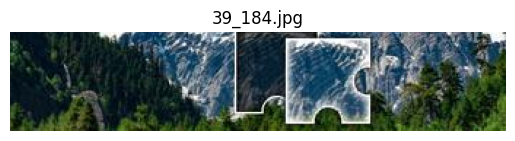

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_184.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_96.jpg: 416x416 1 t, 1 s, 134.5ms
Speed: 1.4ms preprocess, 134.5ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_250.jpg: 416x416 1 s, 118.8ms
Speed: 1.3ms preprocess, 118.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


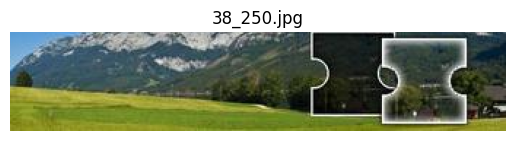

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/38_250.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/42_175.jpg: 416x416 1 s, 116.2ms
Speed: 1.1ms preprocess, 116.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


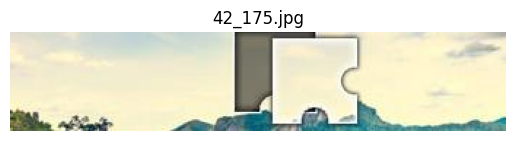

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/42_175.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/18_37.jpg: 416x416 1 t, 1 s, 114.1ms
Speed: 34.7ms preprocess, 114.1ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/14_227.jpg: 416x416 1 t, 1 s, 126.5ms
Speed: 1.1ms preprocess, 126.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_139.jpg: 416x416 (no detections), 115.7ms
Speed: 1.2ms preprocess, 115.7ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 416)


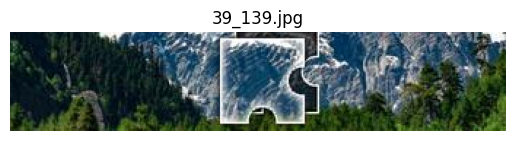

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_139.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/2_169.jpg: 416x416 1 s, 120.2ms
Speed: 1.4ms preprocess, 120.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


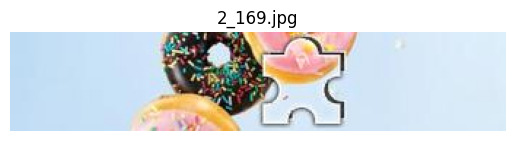

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/2_169.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/12_228.jpg: 416x416 1 t, 1 s, 119.8ms
Speed: 1.4ms preprocess, 119.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_93.jpg: 416x416 1 t, 1 s, 113.5ms
Speed: 1.2ms preprocess, 113.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/19_218.jpg: 416x416 (no detections), 115.5ms
Speed: 1.2ms preprocess, 115.5ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


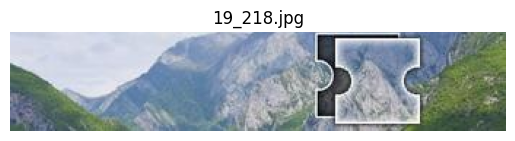

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/19_218.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_4.jpg: 416x416 1 t, 1 s, 119.3ms
Speed: 1.3ms preprocess, 119.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/31_50.jpg: 416x416 1 t, 1 s, 113.6ms
Speed: 1.9ms preprocess, 113.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_126.jpg: 416x416 1 s, 116.6ms
Speed: 1.1ms preprocess, 116.6ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 416)


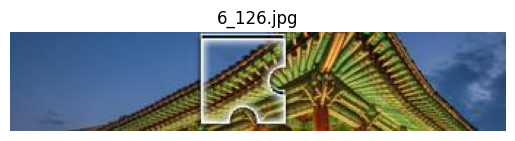

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/6_126.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/28_1.jpg: 416x416 1 t, 1 s, 122.8ms
Speed: 1.1ms preprocess, 122.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_172.jpg: 416x416 (no detections), 116.1ms
Speed: 3.1ms preprocess, 116.1ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


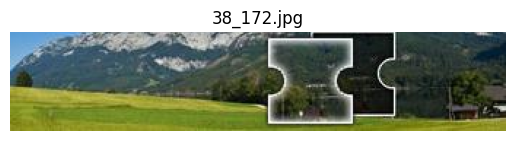

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/38_172.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/34_196.jpg: 416x416 (no detections), 116.4ms
Speed: 1.0ms preprocess, 116.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


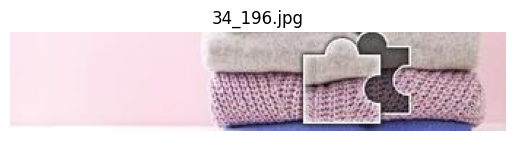

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/34_196.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/29_16.jpg: 416x416 1 t, 1 s, 122.5ms
Speed: 1.4ms preprocess, 122.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/37_79.jpg: 416x416 1 t, 1 s, 120.2ms
Speed: 2.1ms preprocess, 120.2ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/18_11.jpg: 416x416 1 t, 1 s, 131.0ms
Speed: 1.2ms preprocess, 131.0ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/28_138.jpg: 416x416 1 t, 1 s, 116.6ms
Speed: 1.2ms preprocess, 116.6ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_43.jpg: 416x416 1 t, 1 s, 127.6ms
Speed: 1.2ms prep

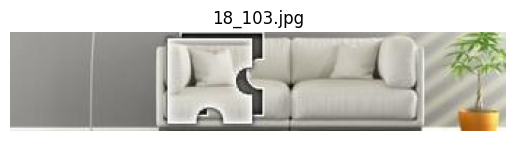

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/18_103.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_183.jpg: 416x416 1 s, 128.7ms
Speed: 1.1ms preprocess, 128.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


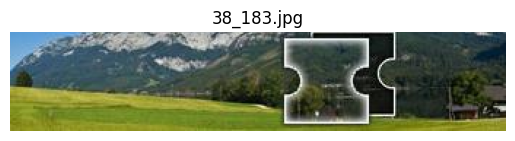

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/38_183.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_115.jpg: 416x416 1 s, 118.0ms
Speed: 1.1ms preprocess, 118.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


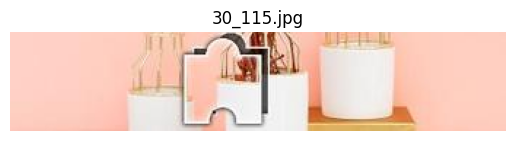

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/30_115.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/29_275.jpg: 416x416 1 t, 1 s, 207.9ms
Speed: 1.4ms preprocess, 207.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/19_18.jpg: 416x416 1 t, 1 s, 115.7ms
Speed: 1.2ms preprocess, 115.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/43_55.jpg: 416x416 1 t, 1 s, 115.2ms
Speed: 1.2ms preprocess, 115.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_185.jpg: 416x416 1 s, 117.4ms
Speed: 1.2ms preprocess, 117.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


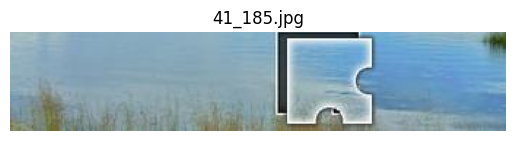

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/41_185.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_216.jpg: 416x416 1 t, 121.6ms
Speed: 1.4ms preprocess, 121.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


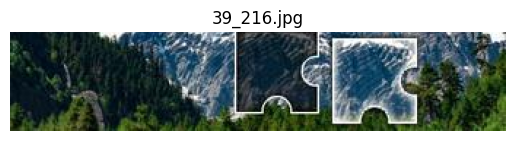

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_216.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_273.jpg: 416x416 1 t, 1 s, 186.0ms
Speed: 1.4ms preprocess, 186.0ms inference, 11.0ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_133.jpg: 416x416 1 s, 114.3ms
Speed: 39.2ms preprocess, 114.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


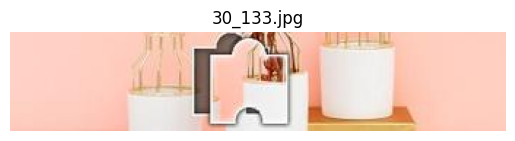

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/30_133.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_1.jpg: 416x416 1 t, 1 s, 208.3ms
Speed: 1.1ms preprocess, 208.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_133.jpg: 416x416 1 t, 116.4ms
Speed: 1.2ms preprocess, 116.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


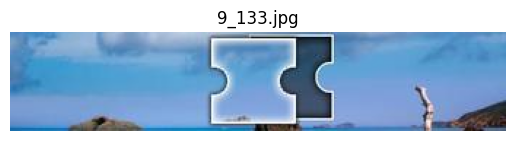

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/9_133.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_270.jpg: 416x416 1 t, 1 s, 207.7ms
Speed: 1.1ms preprocess, 207.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/32_5.jpg: 416x416 1 t, 1 s, 116.0ms
Speed: 1.2ms preprocess, 116.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/22_243.jpg: 416x416 1 t, 1 s, 117.8ms
Speed: 1.1ms preprocess, 117.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_65.jpg: 416x416 1 t, 1 s, 117.5ms
Speed: 1.2ms preprocess, 117.5ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/35_194.jpg: 416x416 1 t, 1 s, 116.0ms
Speed: 1.2ms prepr

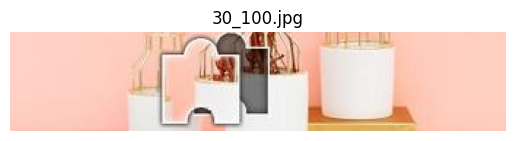

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/30_100.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/23_271.jpg: 416x416 1 t, 1 s, 122.1ms
Speed: 1.1ms preprocess, 122.1ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/19_177.jpg: 416x416 1 t, 205.0ms
Speed: 1.1ms preprocess, 205.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


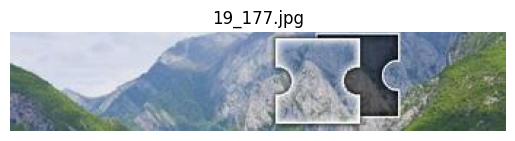

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/19_177.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/27_272.jpg: 416x416 1 t, 1 s, 117.8ms
Speed: 1.4ms preprocess, 117.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/35_103.jpg: 416x416 1 s, 115.4ms
Speed: 1.2ms preprocess, 115.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


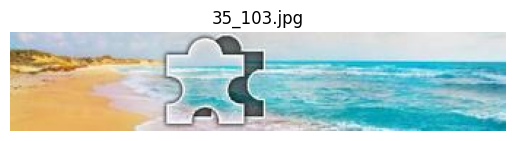

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/35_103.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_89.jpg: 416x416 1 t, 1 s, 123.1ms
Speed: 1.4ms preprocess, 123.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/28_272.jpg: 416x416 1 s, 117.2ms
Speed: 1.2ms preprocess, 117.2ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


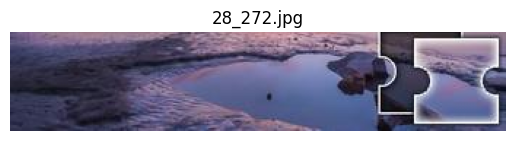

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/28_272.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_183.jpg: 416x416 1 t, 1 s, 124.3ms
Speed: 1.7ms preprocess, 124.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/34_175.jpg: 416x416 1 t, 205.9ms
Speed: 1.2ms preprocess, 205.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


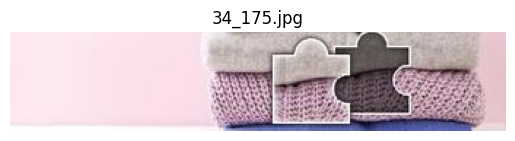

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/34_175.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_129.jpg: 416x416 1 s, 209.9ms
Speed: 5.3ms preprocess, 209.9ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 416)


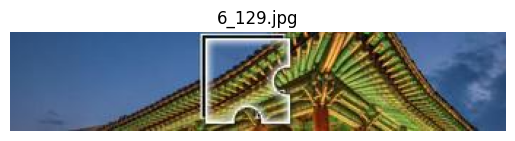

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/6_129.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_170.jpg: 416x416 1 t, 1 s, 116.6ms
Speed: 1.9ms preprocess, 116.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/37_260.jpg: 416x416 1 t, 1 s, 117.4ms
Speed: 1.3ms preprocess, 117.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_0.jpg: 416x416 1 t, 1 s, 115.9ms
Speed: 1.3ms preprocess, 115.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/17_220.jpg: 416x416 1 t, 1 s, 119.1ms
Speed: 1.3ms preprocess, 119.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_6.jpg: 416x416 1 t, 1 s, 123.5ms
Speed: 1.3ms prepr

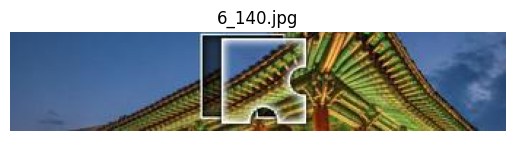

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/6_140.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/42_212.jpg: 416x416 1 t, 1 s, 116.0ms
Speed: 1.1ms preprocess, 116.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/28_87.jpg: 416x416 1 t, 1 s, 115.6ms
Speed: 1.1ms preprocess, 115.6ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/17_58.jpg: 416x416 1 t, 1 s, 115.8ms
Speed: 1.2ms preprocess, 115.8ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/14_174.jpg: 416x416 1 s, 125.8ms
Speed: 1.2ms preprocess, 125.8ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 416)


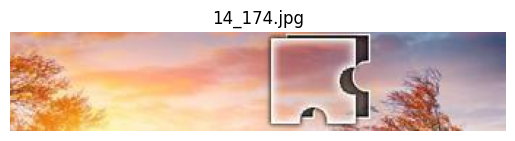

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/14_174.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_260.jpg: 416x416 1 t, 1 s, 131.9ms
Speed: 1.1ms preprocess, 131.9ms inference, 4.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/40_259.jpg: 416x416 1 t, 112.9ms
Speed: 1.1ms preprocess, 112.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


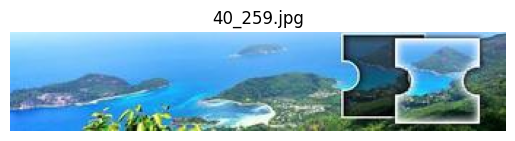

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/40_259.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_102.jpg: 416x416 1 t, 204.6ms
Speed: 1.4ms preprocess, 204.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


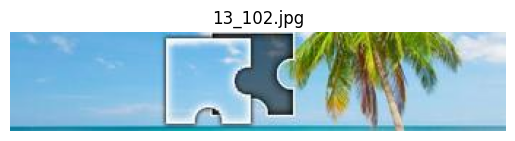

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/13_102.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_173.jpg: 416x416 1 s, 116.1ms
Speed: 1.1ms preprocess, 116.1ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 416)


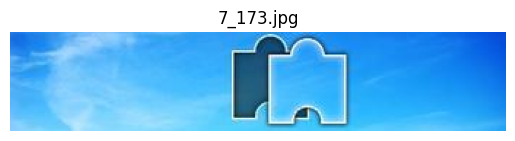

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/7_173.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_170.jpg: 416x416 (no detections), 116.6ms
Speed: 1.1ms preprocess, 116.6ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 416)


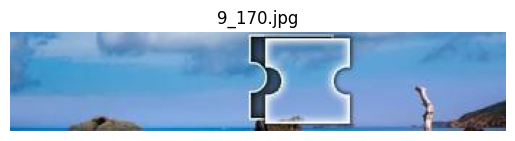

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/9_170.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_105.jpg: 416x416 1 t, 120.9ms
Speed: 1.1ms preprocess, 120.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


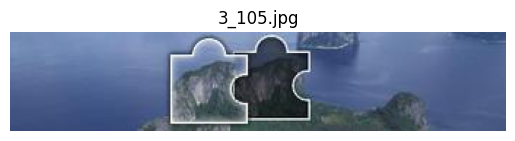

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/3_105.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/12_186.jpg: 416x416 1 s, 204.3ms
Speed: 1.5ms preprocess, 204.3ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)


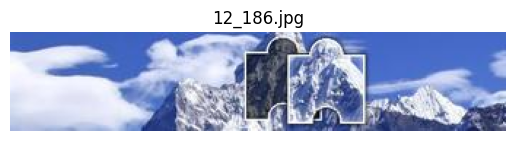

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/12_186.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_101.jpg: 416x416 1 t, 116.9ms
Speed: 20.9ms preprocess, 116.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


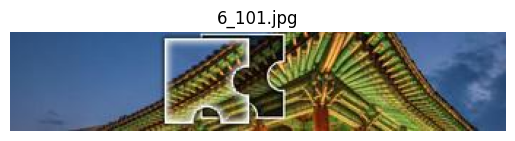

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/6_101.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/1_228.jpg: 416x416 1 t, 1 s, 126.9ms
Speed: 32.6ms preprocess, 126.9ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/32_103.jpg: 416x416 1 t, 1 s, 113.9ms
Speed: 1.2ms preprocess, 113.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/10_268.jpg: 416x416 1 t, 1 s, 115.6ms
Speed: 1.1ms preprocess, 115.6ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_183.jpg: 416x416 1 t, 1 s, 115.1ms
Speed: 1.2ms preprocess, 115.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/40_135.jpg: 416x416 1 t, 1 s, 116.7ms
Speed: 1.2ms p

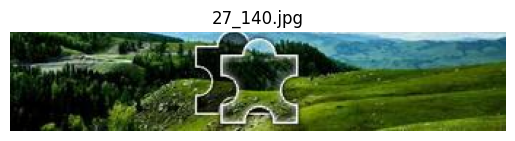

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/27_140.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/27_17.jpg: 416x416 1 t, 1 s, 116.2ms
Speed: 1.0ms preprocess, 116.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/11_6.jpg: 416x416 1 t, 1 s, 203.7ms
Speed: 1.2ms preprocess, 203.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/26_144.jpg: 416x416 (no detections), 203.6ms
Speed: 1.1ms preprocess, 203.6ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


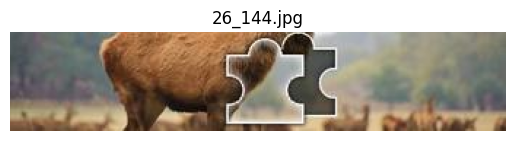

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/26_144.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_60.jpg: 416x416 1 t, 1 s, 120.9ms
Speed: 1.2ms preprocess, 120.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/32_245.jpg: 416x416 1 t, 1 s, 116.9ms
Speed: 1.2ms preprocess, 116.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_273.jpg: 416x416 1 t, 203.6ms
Speed: 1.3ms preprocess, 203.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


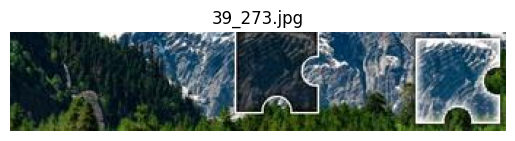

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_273.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_52.jpg: 416x416 1 t, 116.9ms
Speed: 1.1ms preprocess, 116.9ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


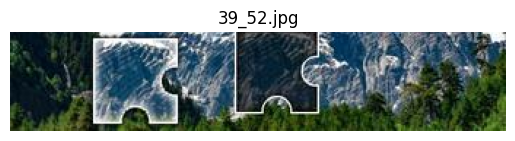

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_52.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_134.jpg: 416x416 1 s, 213.3ms
Speed: 1.8ms preprocess, 213.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


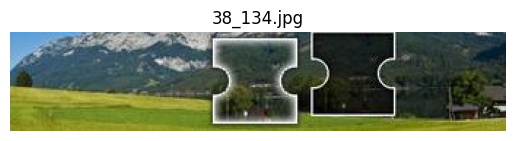

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/38_134.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_18.jpg: 416x416 1 t, 1 s, 122.7ms
Speed: 1.4ms preprocess, 122.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/26_274.jpg: 416x416 1 t, 1 s, 204.1ms
Speed: 1.2ms preprocess, 204.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_255.jpg: 416x416 1 t, 1 s, 203.4ms
Speed: 1.2ms preprocess, 203.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_265.jpg: 416x416 1 t, 1 s, 204.5ms
Speed: 1.2ms preprocess, 204.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/10_16.jpg: 416x416 1 t, 1 s, 117.2ms
Speed: 1.2ms pr

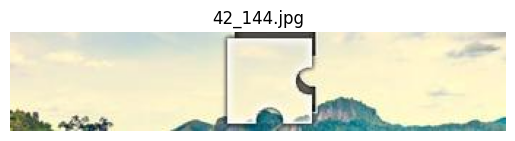

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/42_144.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/40_101.jpg: 416x416 1 t, 1 s, 215.0ms
Speed: 1.4ms preprocess, 215.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/18_254.jpg: 416x416 1 t, 1 s, 116.6ms
Speed: 1.6ms preprocess, 116.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/14_52.jpg: 416x416 1 t, 1 s, 116.7ms
Speed: 1.4ms preprocess, 116.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_102.jpg: 416x416 1 s, 206.5ms
Speed: 1.2ms preprocess, 206.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


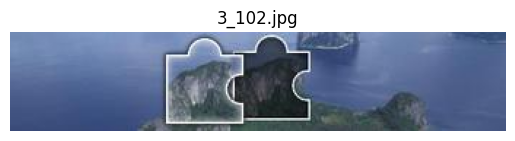

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/3_102.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/16_186.jpg: 416x416 1 s, 210.2ms
Speed: 5.5ms preprocess, 210.2ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 416)


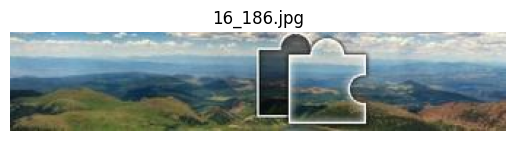

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/16_186.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/27_185.jpg: 416x416 1 t, 1 s, 205.7ms
Speed: 1.4ms preprocess, 205.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_42.jpg: 416x416 1 t, 1 s, 130.6ms
Speed: 1.3ms preprocess, 130.6ms inference, 4.0ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/31_12.jpg: 416x416 1 t, 1 s, 128.4ms
Speed: 1.2ms preprocess, 128.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_135.jpg: 416x416 1 s, 127.4ms
Speed: 1.2ms preprocess, 127.4ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 416)


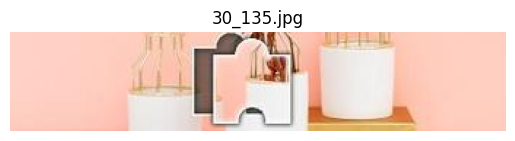

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/30_135.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_228.jpg: 416x416 1 t, 1 s, 119.5ms
Speed: 1.1ms preprocess, 119.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/21_273.jpg: 416x416 1 t, 1 s, 115.6ms
Speed: 3.0ms preprocess, 115.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_224.jpg: 416x416 1 t, 1 s, 116.7ms
Speed: 1.2ms preprocess, 116.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_9.jpg: 416x416 1 t, 1 s, 116.7ms
Speed: 1.2ms preprocess, 116.7ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/5_270.jpg: 416x416 1 t, 1 s, 118.8ms
Speed: 1.2ms prep

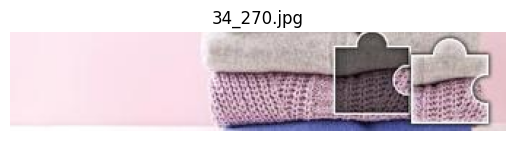

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/34_270.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_182.jpg: 416x416 1 s, 121.0ms
Speed: 1.4ms preprocess, 121.0ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


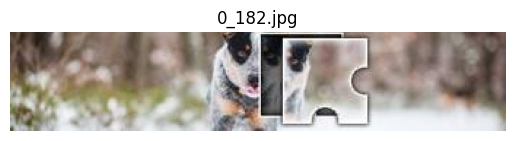

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/0_182.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/33_1.jpg: 416x416 1 t, 1 s, 206.5ms
Speed: 1.1ms preprocess, 206.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/2_184.jpg: 416x416 1 s, 115.8ms
Speed: 1.2ms preprocess, 115.8ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)


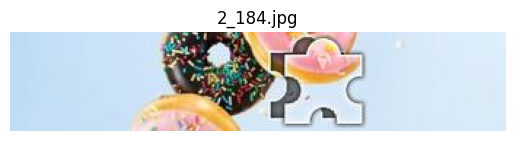

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/2_184.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_132.jpg: 416x416 2 ts, 205.9ms
Speed: 2.2ms preprocess, 205.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/13_0.jpg: 416x416 1 t, 1 s, 116.0ms
Speed: 1.3ms preprocess, 116.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/14_102.jpg: 416x416 1 t, 1 s, 115.4ms
Speed: 1.2ms preprocess, 115.4ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/10_91.jpg: 416x416 1 t, 1 s, 115.3ms
Speed: 1.2ms preprocess, 115.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/36_143.jpg: 416x416 1 t, 115.6ms
Speed: 1.3ms preprocess, 1

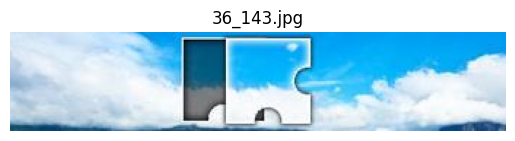

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/36_143.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_221.jpg: 416x416 1 t, 156.0ms
Speed: 7.2ms preprocess, 156.0ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


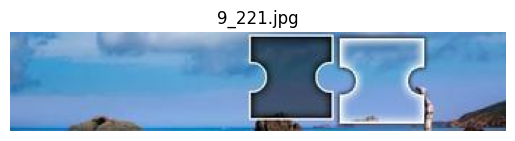

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/9_221.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/30_18.jpg: 416x416 1 t, 1 s, 208.2ms
Speed: 5.9ms preprocess, 208.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/35_4.jpg: 416x416 1 t, 1 s, 200.2ms
Speed: 1.2ms preprocess, 200.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_42.jpg: 416x416 1 t, 1 s, 203.7ms
Speed: 1.2ms preprocess, 203.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_14.jpg: 416x416 1 t, 1 s, 203.7ms
Speed: 2.6ms preprocess, 203.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_48.jpg: 416x416 1 t, 1 s, 116.1ms
Speed: 1.4ms preproces

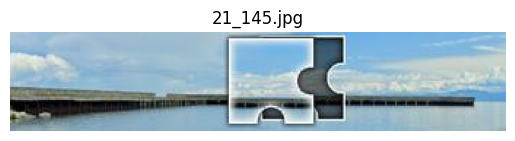

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/21_145.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/18_229.jpg: 416x416 1 t, 1 s, 225.6ms
Speed: 3.6ms preprocess, 225.6ms inference, 15.0ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_118.jpg: 416x416 1 s, 207.6ms
Speed: 1.4ms preprocess, 207.6ms inference, 10.8ms postprocess per image at shape (1, 3, 416, 416)


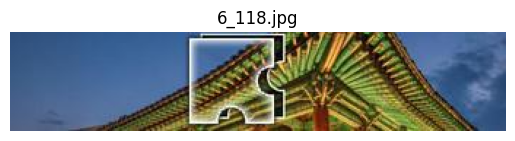

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/6_118.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_129.jpg: 416x416 (no detections), 189.7ms
Speed: 5.2ms preprocess, 189.7ms inference, 1.0ms postprocess per image at shape (1, 3, 416, 416)


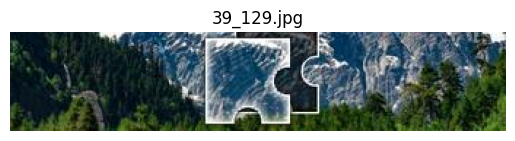

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_129.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/21_60.jpg: 416x416 1 t, 1 s, 215.7ms
Speed: 3.6ms preprocess, 215.7ms inference, 13.9ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_18.jpg: 416x416 1 t, 1 s, 191.4ms
Speed: 38.1ms preprocess, 191.4ms inference, 7.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/12_99.jpg: 416x416 1 t, 1 s, 127.7ms
Speed: 1.2ms preprocess, 127.7ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/17_16.jpg: 416x416 1 t, 1 s, 136.4ms
Speed: 1.2ms preprocess, 136.4ms inference, 4.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/26_103.jpg: 416x416 1 t, 1 s, 141.0ms
Speed: 1.2ms pr

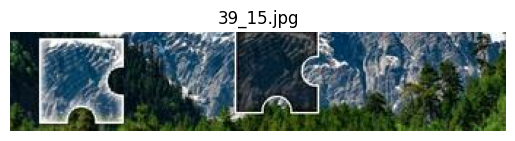

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_15.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_85.jpg: 416x416 1 t, 1 s, 129.0ms
Speed: 4.7ms preprocess, 129.0ms inference, 9.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_0.jpg: 416x416 1 t, 1 s, 128.5ms
Speed: 1.2ms preprocess, 128.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_143.jpg: 416x416 1 s, 128.7ms
Speed: 1.2ms preprocess, 128.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 416)


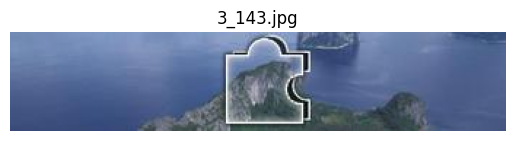

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/3_143.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/9_143.jpg: 416x416 (no detections), 122.9ms
Speed: 1.4ms preprocess, 122.9ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


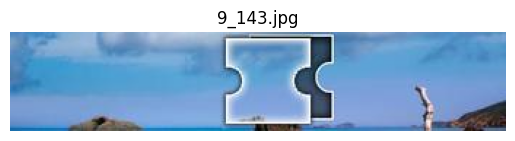

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/9_143.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_59.jpg: 416x416 1 t, 1 s, 121.8ms
Speed: 1.1ms preprocess, 121.8ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_90.jpg: 416x416 1 t, 1 s, 135.3ms
Speed: 1.2ms preprocess, 135.3ms inference, 3.0ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/32_221.jpg: 416x416 (no detections), 119.2ms
Speed: 1.2ms preprocess, 119.2ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


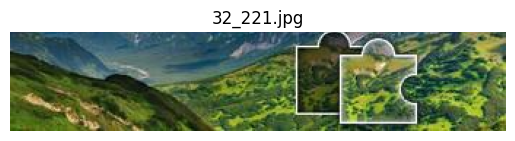

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/32_221.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_56.jpg: 416x416 1 t, 1 s, 120.9ms
Speed: 1.4ms preprocess, 120.9ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_257.jpg: 416x416 (no detections), 127.8ms
Speed: 1.2ms preprocess, 127.8ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


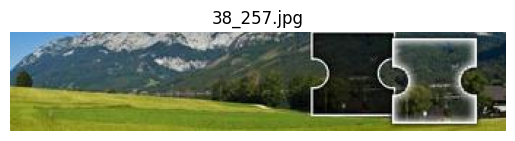

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/38_257.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/3_273.jpg: 416x416 1 t, 1 s, 116.6ms
Speed: 1.5ms preprocess, 116.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/27_7.jpg: 416x416 1 t, 1 s, 115.3ms
Speed: 1.2ms preprocess, 115.3ms inference, 1.1ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/18_84.jpg: 416x416 1 t, 118.5ms
Speed: 2.0ms preprocess, 118.5ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


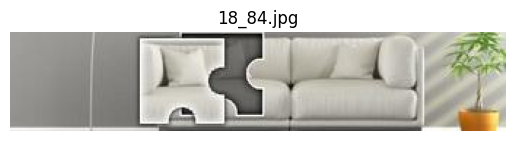

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/18_84.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_187.jpg: 416x416 1 t, 1 s, 119.3ms
Speed: 1.4ms preprocess, 119.3ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/27_92.jpg: 416x416 1 t, 117.1ms
Speed: 1.2ms preprocess, 117.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


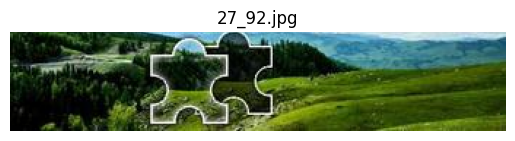

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/27_92.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/8_260.jpg: 416x416 1 t, 1 s, 136.3ms
Speed: 6.0ms preprocess, 136.3ms inference, 2.9ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/21_143.jpg: 416x416 1 t, 126.4ms
Speed: 1.2ms preprocess, 126.4ms inference, 4.1ms postprocess per image at shape (1, 3, 416, 416)


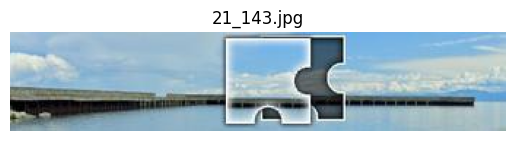

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/21_143.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/8_145.jpg: 416x416 1 t, 1 s, 117.2ms
Speed: 1.1ms preprocess, 117.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/5_51.jpg: 416x416 1 t, 1 s, 126.7ms
Speed: 1.2ms preprocess, 126.7ms inference, 1.4ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/41_146.jpg: 416x416 2 ss, 117.6ms
Speed: 1.2ms preprocess, 117.6ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/42_17.jpg: 416x416 1 t, 1 s, 128.1ms
Speed: 1.2ms preprocess, 128.1ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/22_138.jpg: 416x416 1 s, 116.8ms
Speed: 1.2ms preprocess, 

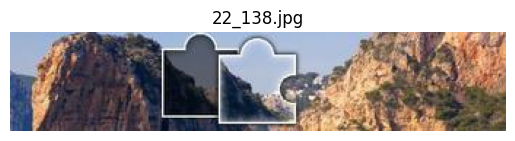

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/22_138.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_170.jpg: 416x416 1 s, 118.7ms
Speed: 1.1ms preprocess, 118.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


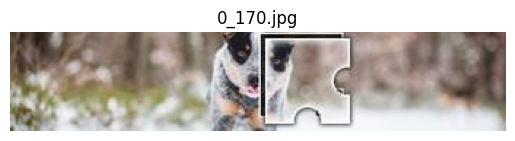

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/0_170.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/39_57.jpg: 416x416 1 t, 118.2ms
Speed: 1.4ms preprocess, 118.2ms inference, 8.5ms postprocess per image at shape (1, 3, 416, 416)


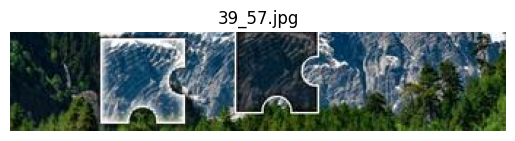

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/39_57.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/32_187.jpg: 416x416 1 s, 117.2ms
Speed: 1.1ms preprocess, 117.2ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


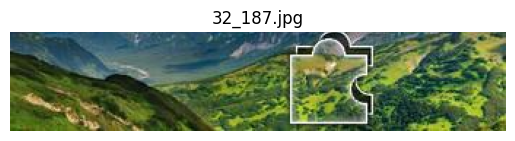

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/32_187.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/34_17.jpg: 416x416 1 t, 1 s, 118.3ms
Speed: 1.1ms preprocess, 118.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/0_271.jpg: 416x416 1 t, 1 s, 117.3ms
Speed: 1.2ms preprocess, 117.3ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/31_91.jpg: 416x416 1 s, 117.7ms
Speed: 1.4ms preprocess, 117.7ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)


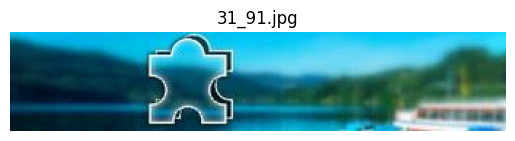

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/31_91.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_185.jpg: 416x416 1 t, 1 s, 124.4ms
Speed: 1.1ms preprocess, 124.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/6_230.jpg: 416x416 1 t, 1 s, 117.1ms
Speed: 1.6ms preprocess, 117.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/7_16.jpg: 416x416 1 t, 1 s, 115.4ms
Speed: 1.9ms preprocess, 115.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 416)

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/34_220.jpg: 416x416 (no detections), 115.4ms
Speed: 1.2ms preprocess, 115.4ms inference, 0.6ms postprocess per image at shape (1, 3, 416, 416)


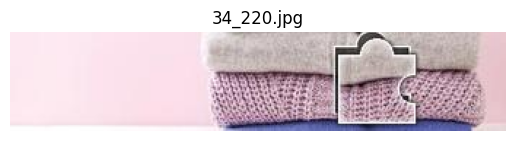

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/34_220.jpg captcha was not found!

image 1/1 /kaggle/input/puzzle-captcha-dataset/images/images/38_267.jpg: 416x416 1 s, 119.4ms
Speed: 1.1ms preprocess, 119.4ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 416)


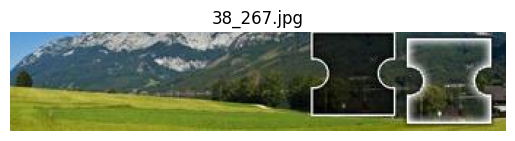

ERROR: for /kaggle/input/puzzle-captcha-dataset/images/images/38_267.jpg captcha was not found!


In [14]:
failed_counter = 0
for image_path in unique_images:
    try:
        get_captcha_position(image_path, show_result=False)
    except:
        failed_counter += 1
        plot_image(image_path)
        print(f"ERROR: for {image_path} captcha was not found!")
        print("=======================================")

In [15]:
f'The coverage is => {(1 - failed_counter / len(unique_images)) * 100:.2f}%'  

'The coverage is => 62.99%'